# Networks

This lesson introduces the network data structure.  Aspects of this lesson are adapted from Andrew Brooks' tutorial on graph optimization.  

https://www.datacamp.com/community/tutorials/networkx-python-graph-tutorial

It also draws from theory material presented at PyCon 2015 by Celia La and Sarah Guido.  

https://github.com/sarguido/networkx-tutorial

You will need to install two packages:

pip install networkx
pip install imageio

The networkx documentation is here: 

https://networkx.github.io/

In [3]:
pip install networkx

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install imageio

Note: you may need to restart the kernel to use updated packages.


In [3]:
# imports
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

%matplotlib inline

# Intro to NetworkX

### Adding & editing graph nodes

We'll first take a look at creating a graph, and adding/editing nodes:

In [4]:
import networkx as nx

'''use g = nx.Graph() to create a graph'''

g = nx.Graph()

'''Lesson: use .add_node(1) to add a single node'''
g.add_node(1)

'''Lesson: use .add_nodes_from([2, 3, 'four', 5])  to add in bulk'''
g.add_nodes_from([2, 3, 'four', 5])

g.nodes()  # run g.nodes() to view the graph

NodeView((1, 2, 3, 'four', 5))

In [5]:
'''Note that NetworkX won't complain if we re-add pre-existing nodes'''

# TODO: try re-adding nodes to see what happens

g.nodes()  # display nodes

NodeView((1, 2, 3, 'four', 5))

In [6]:
'''Lesson: remove syntax is similar to adding, eg:
        .remove_node()
        .remove_nodes_from()
'''

# TODO: try removing both 1) single nodes, 2) nodes in bulk



g.nodes()  # display nodes

NodeView((1, 2, 3, 'four', 5))

### Adding & editing edges

In [7]:
h = nx.Graph()  # let's create a 2nd graph to play with edges

'''Lesson: to create an edge, just specify the 2 nodes that define it: 
        .add_edge('a','b')
    Note that those nodes also get added (no need to make them beforehand!)
'''

h.add_edge('a', 'b')


print('edges:', h.edges())  # see your new edge
print('nodes:', h.nodes())  # verify that new nodes were also added

edges: [('a', 'b')]
nodes: ['a', 'b']


### Visualizing graphs

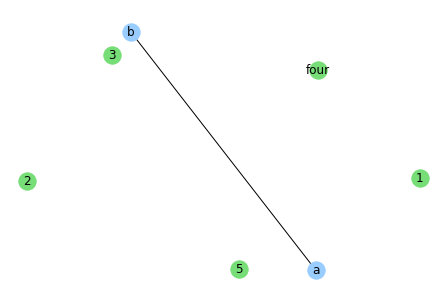

In [8]:

GREEN = "#77DD77"
BLUE = "#99CCFF"

nx.draw(g, node_color=GREEN, with_labels=True)
nx.draw(h, node_color=BLUE, with_labels=True)



#### How would you create the following graph?

<img src="img/graph.png" style="float:left" width="200" />

In [9]:
g = nx.Graph()

g.add_edges_from([('A','B'),('B','D'),('C','D'),('E','D'),('F','D')])

# Directed graphs

directed edges: [(1, 2), (2, 3)]


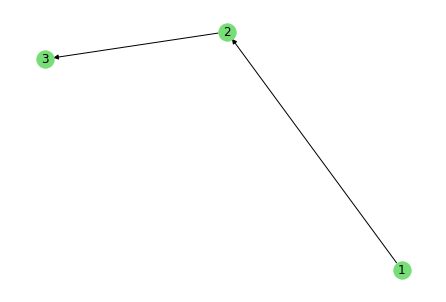

In [10]:
'''Lesson: use nx.DiGraph() to create a new directed graph
'''

dg = nx.DiGraph()


dg.add_edges_from([(1,2), (2,3)])

print('directed edges:', dg.edges())
nx.draw(dg, node_color=GREEN, with_labels=True)


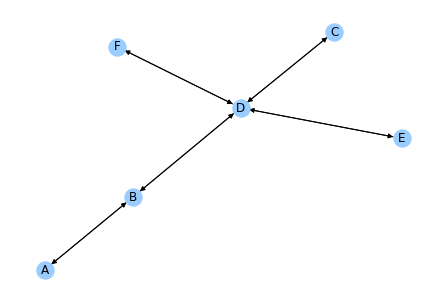

In [11]:
'''We can make directed graphs from existing graphs, eg:
        nx.DiGraph(g)
'''

dg = nx.DiGraph(g)


nx.draw(dg, node_color=BLUE, with_labels=True)

In [12]:
''' Notice that nodes A and B have TWO directed edges:
        A -> B
        B -> A
'''

dg.edges()

OutEdgeView([('A', 'B'), ('B', 'A'), ('B', 'D'), ('D', 'B'), ('D', 'C'), ('D', 'E'), ('D', 'F'), ('C', 'D'), ('E', 'D'), ('F', 'D')])

### Adding attributes to nodes and edges

Sometimes you may want to attach attributes to either the nodes or edges:

* Perhaps you want to save node properties that will be helpful with future analysis
* Perhaps you want to attach visual descriptions, such a node size, edge width or graph color

In [15]:
 pip install decorator

Note: you may need to restart the kernel to use updated packages.


In [13]:
cities = nx.Graph()

cities.add_edge('San Diego', 'Los Angeles', { 'distance': 0.4})
cities.add_edge('New York', 'Nashville', { 'distance': 5.6})
cities.add_edge('Boston', 'D.C.', { 'distance': 0.8})

nx.draw(cities)

TypeError: add_edge() takes 3 positional arguments but 4 were given

# Describing a network

### Degree Distribution:



<img src="img/graph.png" style="float:left; padding-right:20px;" width="200" />

- 1 node with 4 edges
- 1 node with 2 edges
- 4 nodes with 1 edge

Distribution:

    [(1:4), (1:2), (4:1)]


In [14]:
# Degree Distribution for all nodes
print('Degree Distribution:', g.degree())

Degree Distribution: [('A', 1), ('B', 2), ('D', 4), ('C', 1), ('E', 1), ('F', 1)]


In [15]:
# Generate the graph above
paths = nx.Graph()
paths.add_edges_from([
    ('A','B'), ('B','D'), ('B','C'), ('D','E'), ('D','C'),
    ('C','1'), ('1','2'), ('1','3'), ('2','3'), 
    ('E','2'), ('E','4')])

# Display average shortest path details
print('Avg shortest path from A to E is', nx.shortest_path_length(paths, 'A','E'), 'hops:')
print(nx.shortest_path(paths, 'A','E'))

Avg shortest path from A to E is 3 hops:
['A', 'B', 'D', 'E']


## Network Centrality (the higher result is better!)

* **Degree: number of edges** for node X
* **Betweenness: number of shortest paths** that pass through node X
* **Closeness: average of the shortest paths** between X and all other nodes

<img src="img/centrality1.png" style="float:left;" width="400" />
<img src="img/centrality2.png" style="float:left;" width="200" />



In [16]:
''' To calculate Degree Distribution for all nodes, use:
    g.degree()  for non-normalized values,
    nx.degree_centrality(g)   for normalized values
'''

# degree distrib., non-normalized
print('Degree Centrality:')
print(g.degree())

# TODO degree distrib., normalized
print('\nDegree Centrality, Normalized:')
print(nx.degree_centrality(g))


Degree Centrality:
[('A', 1), ('B', 2), ('D', 4), ('C', 1), ('E', 1), ('F', 1)]

Degree Centrality, Normalized:
{'A': 0.2, 'B': 0.4, 'D': 0.8, 'C': 0.2, 'E': 0.2, 'F': 0.2}


In [17]:
''' To calculate betweenness centrality, use:
    nx.betweenness_centrality(g, normalized=True/False)   default is True
'''

# betweenness centrality, non-normalized
print('Betweenness Centrality:')
print(nx.betweenness_centrality(g, normalized=False))

# betweenness centrality, normalized
print('\nBetweenness Centrality, Normalized:')
print(nx.betweenness_centrality(g, normalized=True))


Betweenness Centrality:
{'A': 0.0, 'B': 4.0, 'D': 9.0, 'C': 0.0, 'E': 0.0, 'F': 0.0}

Betweenness Centrality, Normalized:
{'A': 0.0, 'B': 0.4, 'D': 0.9, 'C': 0.0, 'E': 0.0, 'F': 0.0}


In [18]:
''' to calculate closeness centrality, use:
    nx.closeness_centrality(g)
'''

# find closeness centrality
print('Closeness Centrality:')
print(nx.closeness_centrality(g))

Closeness Centrality:
{'A': 0.4166666666666667, 'B': 0.625, 'D': 0.8333333333333334, 'C': 0.5, 'E': 0.5, 'F': 0.5}


# Back to Airline Networks

Previously we used open flights to examine airline routes around the world.  We found that it was a bit of a pain to store the data in tables, and merge different information.  We can model it as network instead.  I've cleaned the data up a bit, and selected out only the routes operated by Delta, making it a bit more managable.  


In [19]:
# read the data
routes = pd.read_csv('data/delta_routes.csv')
routes.head()

,Unnamed: 0,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment,latitude_source,longitude_source,latitude_dest,longitude_dest
0,0,DL,2009.0,ABE,4355.0,ATL,3682.0,NaN,0,717,40.652100,-75.440804,33.636700,-84.428101
1,1,DL,2009.0,ABQ,4019.0,ATL,3682.0,NaN,0,757 320,35.040199,-106.609001,33.636700,-84.428101
2,2,DL,2009.0,ABQ,4019.0,MSP,3858.0,NaN,0,320,35.040199,-106.609001,44.882000,-93.221802
3,3,DL,2009.0,ACC,248.0,JFK,3797.0,NaN,0,76W,5.605190,-0.166786,40.639801,-73.778900
4,4,DL,2009.0,ACC,248.0,ROB,1063.0,NaN,0,76W,5.605190,-0.166786,6.233790,-10.362300


### As a review, let's build an interactive map to see what this looks like



In [23]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [24]:
pip install pyproj

Note: you may need to restart the kernel to use updated packages.


In [20]:
import pyproj
import folium

In [21]:

# when creating a function, it is good practice to define the API!
def getGreatCirclePoints(startlat, startlon, endlat, endlon): 
    """
    startlat - starting latitude 
    startlon - starting longitude 
    endlat   - ending latitude 
    endlon   - ending longitude 
    
    returns - a list of tuples, where each tuple is the lat-long for a point
              along the curve.  
    """
    # calculate distance between points
    g = pyproj.Geod(ellps='WGS84')
    (az12, az21, dist) = g.inv(startlon, startlat, endlon, endlat)

    # calculate line string along path with segments <= 20 km
    lonlats = g.npts(startlon, startlat, endlon, endlat,
                     1 + int(dist / 20000))

    # the npts function uses lon-lat, while the folium functions use lat-lon
    # This sort of thing is maddening!  What happens is the lines don't show
    # up on the map and you don't know why.  Learn from my mistakes
    latlons = []
    for lon_lat in lonlats: 
        
        # this is how you get values out of a tuple
        (lon, lat) = lon_lat
        
        # add them to our list
        latlons.append((lat, lon)) 
    
    # npts doesn't include start/end points, so prepend/append them
    latlons.insert(0, (startlat, startlon))
    latlons.append((endlat, endlon))
    
    return latlons


In [22]:
# create a basic map, centered on Lexington
m = folium.Map(
    location=[38.034,-84.500],
    tiles='Stamen Toner',
    zoom_start=4
)


In [23]:
routes.head()

,Unnamed: 0,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment,latitude_source,longitude_source,latitude_dest,longitude_dest
0,0,DL,2009.0,ABE,4355.0,ATL,3682.0,NaN,0,717,40.652100,-75.440804,33.636700,-84.428101
1,1,DL,2009.0,ABQ,4019.0,ATL,3682.0,NaN,0,757 320,35.040199,-106.609001,33.636700,-84.428101
2,2,DL,2009.0,ABQ,4019.0,MSP,3858.0,NaN,0,320,35.040199,-106.609001,44.882000,-93.221802
3,3,DL,2009.0,ACC,248.0,JFK,3797.0,NaN,0,76W,5.605190,-0.166786,40.639801,-73.778900
4,4,DL,2009.0,ACC,248.0,ROB,1063.0,NaN,0,76W,5.605190,-0.166786,6.233790,-10.362300


In [24]:
routes = routes.drop_duplicates(subset=['source','dest'])
routes

,Unnamed: 0,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment,latitude_source,longitude_source,latitude_dest,longitude_dest
0,0,DL,2009.0,ABE,4355.0,ATL,3682.0,NaN,0,717,40.652100,-75.440804,33.636700,-84.428101
1,1,DL,2009.0,ABQ,4019.0,ATL,3682.0,NaN,0,757 320,35.040199,-106.609001,33.636700,-84.428101
2,2,DL,2009.0,ABQ,4019.0,MSP,3858.0,NaN,0,320,35.040199,-106.609001,44.882000,-93.221802
3,3,DL,2009.0,ACC,248.0,JFK,3797.0,NaN,0,76W,5.605190,-0.166786,40.639801,-73.778900
4,4,DL,2009.0,ACC,248.0,ROB,1063.0,NaN,0,76W,5.605190,-0.166786,6.233790,-10.362300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1141,1141,DL,2009.0,YUL,146.0,LGA,3697.0,NaN,0,ERJ CR7,45.470600,-73.740799,40.777199,-73.872597
1142,1142,DL,2009.0,YYC,178.0,MSP,3858.0,NaN,0,319,51.113899,-114.019997,44.882000,-93.221802
1143,1143,DL,2009.0,YYZ,193.0,ATL,3682.0,NaN,0,NaN,43.677200,-79.630600,33.636700,-84.428101
1144,1144,DL,2009.0,YYZ,193.0,JFK,3797.0,NaN,0,CR7 ERJ,43.677200,-79.630600,40.639801,-73.778900


In [30]:
# define the map in the same way, but use great circles for the lines

# Define some empty sets
airport_set = set()
route_set = set()

# Make sure we don't add duplicates, especially for the origins
for name, row in routes.iterrows():
    
    if row['source'] not in airport_set: 
        popup_string = row['source']
        marker = folium.CircleMarker([row["latitude_source"], row["longitude_source"]], 
                                     color='DarkCyan',
                                     fill_color='DarkCyan', 
                                     radius=5, popup=popup_string)
        marker.add_to(m)
        airport_set.add(row['source'])
        
    if row['dest'] not in airport_set: 
        popup_string = row['dest']
        marker = folium.CircleMarker([row["latitude_dest"], row["longitude_dest"]], 
                                     color='MidnightBlue',
                                     fill_color='MidnightBlue', 
                                     radius=5, popup=popup_string)
        marker.add_to(m)
        airport_set.add(row['dest'])
    
    # PolyLine will accept a whole list of tuples, not just two
    if (row['source'],row['dest']) not in route_set:            
        popup_string = row['source'] + '-' + row['dest']       
        
        gc_points = getGreatCirclePoints(row["latitude_source"], 
                                         row["longitude_source"], 
                                         row["latitude_dest"], 
                                         row["longitude_dest"])
        
        line = folium.PolyLine(gc_points, weight=2, popup=popup_string)
        line.add_to(m)
        route_set.add((row['source'],row['dest']))
m

In [25]:
# save it to its own file
m.save("delta.html")

# Homework

1. Represent the Delta flights as a network.  What are the nodes?  What are the links?
2. Which is the most important airport in Delta's network?  Support your answer using appropriate network metrics.  
3. How many flights are needed to reach Honolulu?  
4. What is the maximum number of flights needed to reach any destination in Delta's network?
5. Convert the network into a weighted network, using the travel time as the weight.  Assume that planes fly at 500 mph, plus 30 minutes to take off + 30 minutes to land.  
6. How long does it take to travel to Honolulu, in flight times.  

In [ ]:
#1. Present the Delta flights as a network. 

In [26]:

edges = routes[['source', 'dest']].values
edges

array([['ABE', 'ATL'],
       ['ABQ', 'ATL'],
       ['ABQ', 'MSP'],
       ...,
       ['YYZ', 'ATL'],
       ['YYZ', 'JFK'],
       ['ZRH', 'ATL']], dtype=object)

In [27]:

dg1 = nx.DiGraph()
dg1.add_edges_from(edges)


In [28]:
len(dg1.nodes()), len(dg1.edges())

(230, 1146)

directed edges: [('ABE', 'ATL'), ('ATL', 'ABE'), ('ATL', 'ABQ'), ('ATL', 'AGS'), ('ATL', 'ALB'), ('ATL', 'AMS'), ('ATL', 'AUA'), ('ATL', 'AUS'), ('ATL', 'AVL'), ('ATL', 'BDA'), ('ATL', 'BDL'), ('ATL', 'BHM'), ('ATL', 'BNA'), ('ATL', 'BOG'), ('ATL', 'BON'), ('ATL', 'BOS'), ('ATL', 'BRU'), ('ATL', 'BSB'), ('ATL', 'BTR'), ('ATL', 'BUF'), ('ATL', 'BWI'), ('ATL', 'BZE'), ('ATL', 'CAE'), ('ATL', 'CAK'), ('ATL', 'CCS'), ('ATL', 'CDG'), ('ATL', 'CHA'), ('ATL', 'CHS'), ('ATL', 'CLE'), ('ATL', 'CLT'), ('ATL', 'CMH'), ('ATL', 'COS'), ('ATL', 'CRW'), ('ATL', 'CUN'), ('ATL', 'CVG'), ('ATL', 'CZM'), ('ATL', 'DAB'), ('ATL', 'DAY'), ('ATL', 'DCA'), ('ATL', 'DEN'), ('ATL', 'DFW'), ('ATL', 'DSM'), ('ATL', 'DTW'), ('ATL', 'DUB'), ('ATL', 'DUS'), ('ATL', 'DXB'), ('ATL', 'ECP'), ('ATL', 'ELP'), ('ATL', 'EWR'), ('ATL', 'EYW'), ('ATL', 'EZE'), ('ATL', 'FAY'), ('ATL', 'FCO'), ('ATL', 'FLL'), ('ATL', 'FNT'), ('ATL', 'FPO'), ('ATL', 'FRA'), ('ATL', 'GCM'), ('ATL', 'GDL'), ('ATL', 'GIG'), ('ATL', 'GNV'), ('ATL',

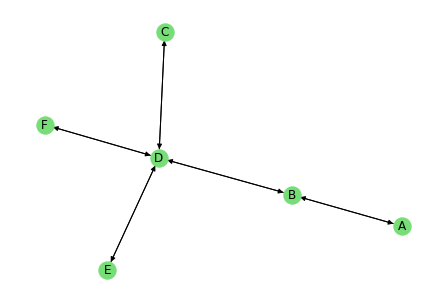

In [29]:
print('directed edges:', dg1.edges())
nx.draw(dg, node_color=GREEN, with_labels=True)

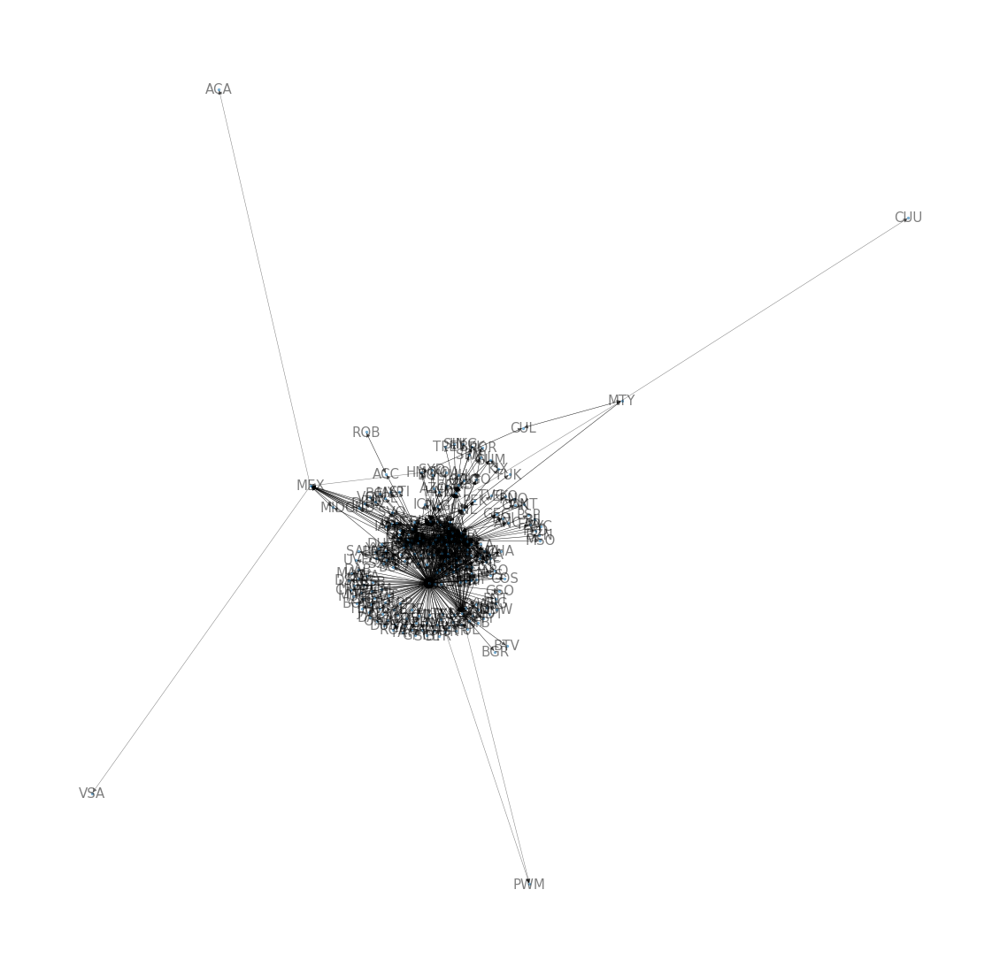

In [30]:
#Network for Delta flights. 
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
nx.draw_networkx(dg1, ax=ax, node_size=5,
                 font_size=15, alpha=.5,
                 width=.5)
ax.set_axis_off()

In [ ]:
#2. Which is the most important airport in Delta's network?
# Most important airport is the one that has most edges
#So I need to find the airports that has the most edges

In [32]:
''' To calculate Degree Distribution for all nodes, use:
    g.degree()  for non-normalized values,
    nx.degree_centrality(g)   for normalized values
'''

# degree distrib., non-normalized
print('Degree Centrality:')
print(dg1.degree())

# TODO degree distrib., normalized
print('\nDegree Centrality, Normalized:')
print(nx.degree_centrality(dg1))


Degree Centrality:
[('ABE', 2), ('ATL', 337), ('ABQ', 4), ('MSP', 120), ('ACC', 4), ('JFK', 153), ('ROB', 2), ('AGS', 2), ('ALB', 2), ('AMS', 18), ('BOM', 2), ('BOS', 33), ('DTW', 153), ('EWR', 12), ('PDX', 14), ('SEA', 28), ('ANC', 4), ('SLC', 86), ('AUA', 6), ('AUS', 9), ('AVL', 2), ('BDA', 6), ('BDL', 6), ('BHM', 2), ('BNA', 7), ('BOG', 4), ('BON', 2), ('BRU', 4), ('BSB', 2), ('BTR', 2), ('BUF', 7), ('BWI', 12), ('BZE', 4), ('CAE', 2), ('CAK', 2), ('CCS', 2), ('CDG', 25), ('CHA', 2), ('CHS', 7), ('CLE', 6), ('CLT', 11), ('CMH', 10), ('COS', 2), ('CRW', 2), ('CUN', 22), ('CVG', 45), ('CZM', 2), ('DAB', 2), ('DAY', 5), ('DCA', 9), ('DEN', 12), ('DFW', 13), ('DSM', 2), ('DUB', 4), ('DUS', 2), ('DXB', 2), ('ECP', 2), ('ELP', 2), ('EYW', 4), ('EZE', 2), ('FAY', 2), ('FCO', 5), ('FLL', 12), ('FNT', 2), ('FPO', 2), ('FRA', 6), ('GCM', 4), ('GDL', 6), ('GIG', 2), ('GNV', 2), ('GPT', 2), ('GRR', 8), ('GRU', 6), ('GSO', 3), ('GSP', 2), ('GUA', 6), ('HNL', 18), ('HOU', 2), ('HSV', 2), ('IAD', 

In [ ]:
# The most important airport is Atlanta. It has 337 edges. 

In [ ]:
#3. How many flights are needed to reach Honolulu? (From Lexington) 

In [33]:
#From Lexington 
paths = nx.Graph()
paths.add_edges_from(edges)

# Display average shortest path details
print('You need two flights to reach Honolulu from Lexington.', nx.shortest_path_length(paths, 'LEX','HNL'),'paths')
print(nx.shortest_path(paths, 'LEX','HNL'))

You need two flights to reach Honolulu from Lexington. 2 paths
['LEX', 'ATL', 'HNL']


In [ ]:
#4. What is the maximum number of flights needed to reach any destination in Delta's network?

In [34]:
routes1 = routes.drop_duplicates(subset=['dest'])
routes1

,Unnamed: 0,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment,latitude_source,longitude_source,latitude_dest,longitude_dest
0,0,DL,2009.0,ABE,4355.0,ATL,3682.0,NaN,0,717,40.652100,-75.440804,33.636700,-84.428101
2,2,DL,2009.0,ABQ,4019.0,MSP,3858.0,NaN,0,320,35.040199,-106.609001,44.882000,-93.221802
3,3,DL,2009.0,ACC,248.0,JFK,3797.0,NaN,0,76W,5.605190,-0.166786,40.639801,-73.778900
4,4,DL,2009.0,ACC,248.0,ROB,1063.0,NaN,0,76W,5.605190,-0.166786,6.233790,-10.362300
8,8,DL,2009.0,AMS,580.0,BOM,2997.0,NaN,0,76W,52.308601,4.763890,19.088699,72.867897
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
884,884,DL,2009.0,NRT,2279.0,TPE,2276.0,NaN,0,744,35.764702,140.386002,25.077700,121.233002
1057,1057,DL,2009.0,SLC,3536.0,EKO,5736.0,NaN,0,EM2,40.788399,-111.977997,40.824902,-115.792000
1071,1071,DL,2009.0,SLC,3536.0,OAK,3453.0,NaN,0,319 320,40.788399,-111.977997,37.721298,-122.221001
1072,1072,DL,2009.0,SLC,3536.0,ONT,3734.0,NaN,0,319,40.788399,-111.977997,34.056000,-117.600998


In [57]:
#LEX to ATL
df = routes[routes['source']=='LEX']
df

,Unnamed: 0,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment,latitude_source,longitude_source,latitude_dest,longitude_dest
658,658,DL,2009.0,LEX,4017.0,ATL,3682.0,NaN,0,M88 717,38.036499,-84.605904,33.636700,-84.428101
659,659,DL,2009.0,LEX,4017.0,LGA,3697.0,NaN,0,ERJ,38.036499,-84.605904,40.777199,-73.872597


In [58]:
#ATL to HNL
df1 = routes[routes['dest']=='HNL']
df1

,Unnamed: 0,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment,latitude_source,longitude_source,latitude_dest,longitude_dest
84,84,DL,2009.0,ATL,3682.0,HNL,3728.0,NaN,0,333,33.636700,-84.428101,21.318701,-157.921997
451,451,DL,2009.0,FUK,2305.0,HNL,3728.0,NaN,0,76W,33.585899,130.451004,21.318701,-157.921997
609,609,DL,2009.0,KIX,3992.0,HNL,3728.0,NaN,0,333,34.427299,135.244003,21.318701,-157.921997
635,635,DL,2009.0,LAX,3484.0,HNL,3728.0,NaN,0,76W 757 753,33.942501,-118.407997,21.318701,-157.921997
866,866,DL,2009.0,NGO,3942.0,HNL,3728.0,NaN,0,76W,34.858398,136.804993,21.318701,-157.921997
873,873,DL,2009.0,NRT,2279.0,HNL,3728.0,NaN,0,744 76W 333,35.764702,140.386002,21.318701,-157.921997
1014,1014,DL,2009.0,SEA,3577.0,HNL,3728.0,NaN,0,753,47.449001,-122.308998,21.318701,-157.921997
1026,1026,DL,2009.0,SFO,3469.0,HNL,3728.0,NaN,0,753,37.618999,-122.375000,21.318701,-157.921997
1060,1060,DL,2009.0,SLC,3536.0,HNL,3728.0,NaN,0,763,40.788399,-111.977997,21.318701,-157.921997


In [35]:
#This is all possible destinations without duplicates 
destinations = routes1[['dest']].values
destinations

array([['ATL'],
       ['MSP'],
       ['JFK'],
       ['ROB'],
       ['BOM'],
       ['BOS'],
       ['DTW'],
       ['EWR'],
       ['PDX'],
       ['SEA'],
       ['SLC'],
       ['ABE'],
       ['ABQ'],
       ['AGS'],
       ['ALB'],
       ['AMS'],
       ['AUA'],
       ['AUS'],
       ['AVL'],
       ['BDA'],
       ['BDL'],
       ['BHM'],
       ['BNA'],
       ['BOG'],
       ['BON'],
       ['BRU'],
       ['BSB'],
       ['BTR'],
       ['BUF'],
       ['BWI'],
       ['BZE'],
       ['CAE'],
       ['CAK'],
       ['CCS'],
       ['CDG'],
       ['CHA'],
       ['CHS'],
       ['CLE'],
       ['CLT'],
       ['CMH'],
       ['COS'],
       ['CRW'],
       ['CUN'],
       ['CVG'],
       ['CZM'],
       ['DAB'],
       ['DAY'],
       ['DCA'],
       ['DEN'],
       ['DFW'],
       ['DSM'],
       ['DUB'],
       ['DUS'],
       ['DXB'],
       ['ECP'],
       ['ELP'],
       ['EYW'],
       ['EZE'],
       ['FAY'],
       ['FCO'],
       ['FLL'],
       ['FNT'],
       [

In [ ]:
#5. Convert the network into a weighted network, using the travel time as the weight. Assume that planes fly at 500 mph, plus 30 minutes to take off + 30 minutes to land.

In [ ]:
#We know that to get time we need to divide distance over speed. The speed was given to us as 500 mph. As well as, 
# we need to add 1 hour to each weight as 30 minutes for take off and 30 minutes for landing. 
# First I need to find the destinations for each link. 

In [59]:
!pip install haversine

In [36]:
import haversine as hs

In [38]:
#Calculating distance between the source and dest
from haversine import Unit
loc1=(latitude_source,longitude_source)
loc2=(latitude_dest,longitude_dest)
hs.haversine(loc1,loc2,unit=Unit.MILES)

NameError: name 'latitude_source' is not defined

In [51]:
from haversine import Unit
from math import radians, cos, sin, asin, sqrt
routes1["longitude_source", routes1['longitude_source'].astype(float)]
routes1["latitude_source", routes1['latitude_source'].astype(float)]
routes1["longitude_dest", routes1['longitude_dest'].astype(float)]
routes1["latitude_dest", routes1['latitude_dest'].astype(float)]

def haversine(longitude_source, latitude_source, longitude_dest, latitude_dest):
    longitude_source, latitude_source, longitude_dest, latitude_dest= map(radians,[longitude_source, latitude_source, longitude_dest, latitude_dest])
    dlon =  longitude_dest - longitude_source 
    dlat = latitude_dest - latitude_source
    a = sin(dlat/2)**2 + cos(latitude_source) * cos(latitude_dest) * sin(dlon/2)**2  #I found this equation on the interent.                              
    c = 2 * asin(sqrt(a))    #It lets you calculate the distnace in miles from the cordinates between two locations.  
    miles = 3963* c # This converts to miles 
    return miles

    
# Creating a new column to generate the output by passing lat long information to Haversine Equation
routes1['distance'] = [haversine(routes1.longitude_source,routes1.latitude_source,routes1.longitude_dest,routes1.latitude_dest)]
routes1['distance'] 
# Printing the data table 
routes1.head()

TypeError: '('longitude_source', 0       -75.440804
2      -106.609001
3        -0.166786
4        -0.166786
8         4.763890
           ...    
884     140.386002
1057   -111.977997
1071   -111.977997
1072   -111.977997
1077   -111.977997
Name: longitude_source, Length: 229, dtype: float64)' is an invalid key

In [ ]:
routes1["longitude_source", routes1['longitude_source'].astype(float)]
routes1["latitude_source", routes1['latitude_source'].astype(float)]
routes1["longitude_dest", routes1['longitude_dest'].astype(float)]
routes1["latitude_dest", routes1['latitude_dest'].astype(float)]


In [40]:
# I cannot solve this error. But after I get the distance between source and destination for each route the next step
# will be to divide each distance by 500 mph and + 1 hr (30 minutes take off + 30 minutes landing)
# I will be using this formula 
speed = 500
routes1['time'] = ((routes1['distance'] / speed)+1).round(2)

routes1.head()

KeyError: 'distance'

In [68]:
# Distance from Lexington to Atlanta
from haversine import Unit
loc1=(38.036499,-84.605904)
loc2=(33.636700,-84.428101)
df2=hs.haversine(loc1,loc2,unit=Unit.MILES)
df2


304.1600493247378

In [67]:
# Distance from Atlanta to Honolulu
from haversine import Unit
loc1=(33.636700,-84.428101)
loc2=(21.318701,-157.921997)
df3=hs.haversine(loc1,loc2,unit=Unit.MILES)
df3

4494.8953620327875

In [ ]:
#6. How long does it take to travel to Honolulu, in flight times.
# If we are flying from Lexington, first we need to know how long it takes to get from Lexington to Atlanta
#Then from Atlanta to Honolulu 

In [73]:
#This is time that takes to fly From Lexington to Atlanta with speed of 500 mph
df4=((df2/500)+1)
df4

1.6083200986494757

In [74]:
#This is time that takes to fly From Atlanta to Honolulu with speed of 500 mph
df5=((df3/500)+1)
df5

9.989790724065575

In [75]:
#This is total time how long it takes to fly to Honolulu from Lexington 
dfTotal= df4+df5
dfTotal

11.59811082271505